<a href="https://www.kaggle.com/code/shamseldeenismaiil/ovarian-cancer?scriptVersionId=147817484" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
dirnames =[]
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        dirnames.append(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


In [2]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib as mpl
from IPython.display import display
%matplotlib inline
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc, accuracy_score
from skimage import data
from skimage.color import rgb2hed, hed2rgb

In [3]:
img = Image.open("/kaggle/input/UBC-OCEAN/train_images/10077.png")

In [4]:
img_size = img.size
print("the image size is: {}".format(img_size))

the image size is: (53143, 39150)


In [5]:
newsize = (3000,3000)
img0 = img.resize(newsize)

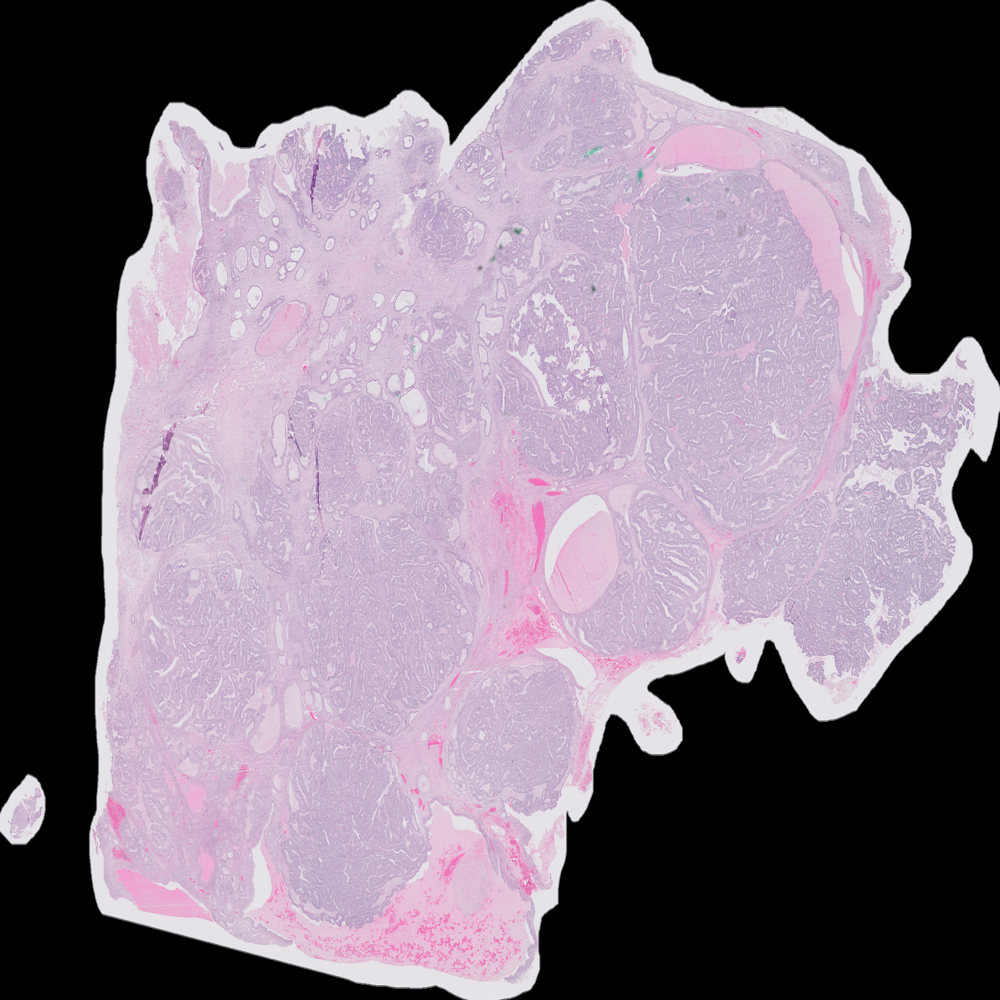

In [6]:
display(img0)

In [7]:
imgCrop = img.crop([250,250,650,750])


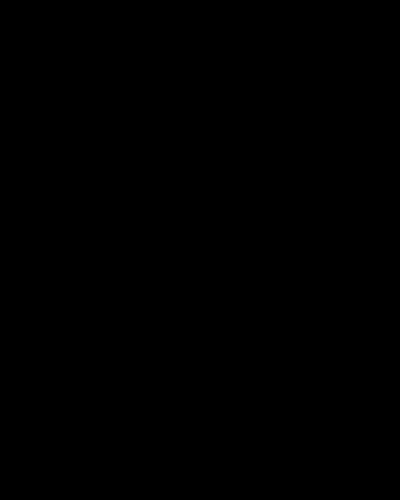

In [8]:
display(imgCrop)

In [9]:
imgCropData = np.array(imgCrop)

In [10]:
imgCropData.shape

(500, 400, 3)

In [11]:
imgCropData

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [12]:
imgSize0 = img.size[0]
imgSize0

53143

In [13]:
imgSize1 = img.size[1]
imgSize1

39150

(224, 100)


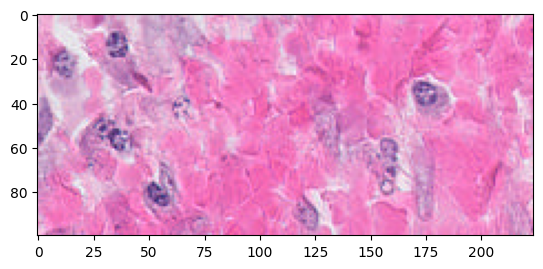

In [14]:
left = int(img.size[0]/2-224/2)
upper = int(img.size[1]/2-100/2)
right = left +224
lower = upper + 100
img_cropped = img.crop((left, upper,right,lower))
print(img_cropped.size)
plt.imshow(np.asarray(img_cropped))

In [15]:
img_croppedData = np.array(img_cropped)
img_croppedData

array([[[238, 185, 220],
        [231, 182, 220],
        [233, 181, 218],
        ...,
        [247, 151, 214],
        [253, 157, 208],
        [255, 150, 201]],

       [[242, 192, 219],
        [234, 185, 216],
        [238, 180, 217],
        ...,
        [244, 143, 210],
        [245, 143, 202],
        [248, 136, 193]],

       [[238, 191, 214],
        [228, 178, 208],
        [244, 180, 219],
        ...,
        [244, 145, 198],
        [231, 121, 194],
        [235, 108, 190]],

       ...,

       [[230, 199, 227],
        [244, 185, 231],
        [245, 208, 221],
        ...,
        [224, 152, 202],
        [237, 162, 200],
        [166,  96, 164]],

       [[248, 204, 221],
        [248, 195, 219],
        [251, 195, 234],
        ...,
        [231, 165, 213],
        [228, 152, 193],
        [192, 119, 172]],

       [[255, 197, 224],
        [251, 197, 224],
        [248, 175, 230],
        ...,
        [234, 189, 221],
        [216, 143, 202],
        [247, 159, 198]]

In [16]:
train_photodf = pd.read_csv("/kaggle/input/UBC-OCEAN/train.csv")

In [17]:
train_photodf_index = pd.read_csv("/kaggle/input/UBC-OCEAN/train.csv",index_col=0)

In [18]:
list_files = []
# giving directory name
dirname = '/kaggle/input/UBC-OCEAN/train_thumbnails'
 
# giving file extension
ext = ('_thumbnail.png')
 
# iterating over all files
for files in os.listdir(dirname):
    if files.endswith(ext):
        list_files.append(files)  
    else:
        continue

In [19]:
list_files_array = np.array(list_files)

In [20]:
list_files_array[0]

'52275_thumbnail.png'

In [21]:
id_images = [item.split('_thumbnail.png')[0] for item in list_files_array]
id_images = list(map(int, id_images))
print(id_images)


[52275, 47960, 4, 57468, 20316, 27315, 46793, 43815, 25792, 48502, 55281, 56221, 29147, 43875, 33708, 57265, 15912, 60287, 6140, 27245, 3881, 52438, 11559, 36063, 14039, 38019, 56500, 17487, 46172, 18547, 9183, 28562, 54990, 46736, 59515, 9254, 20329, 38849, 39255, 4827, 38647, 34247, 706, 35792, 20463, 52375, 21232, 20205, 53377, 15470, 20312, 48861, 18568, 12244, 52784, 9658, 52461, 64771, 38048, 9509, 59760, 52752, 13526, 45254, 47020, 43671, 40079, 44962, 44976, 15188, 62828, 1666, 26939, 13387, 3672, 61033, 18138, 1943, 39144, 5114, 61493, 11557, 24617, 5251, 8985, 6363, 38687, 59002, 58947, 10642, 52612, 28393, 31300, 52846, 19030, 40639, 29615, 14312, 58895, 39146, 10143, 50048, 44283, 281, 39269, 8213, 34649, 30515, 30738, 35197, 2391, 7955, 65533, 61823, 31793, 22924, 6951, 36678, 63897, 17174, 29240, 35239, 10246, 21432, 35953, 63367, 10077, 49587, 34688, 6175, 53402, 52259, 57711, 66, 48973, 14401, 54825, 41801, 7490, 1080, 14127, 47431, 5456, 45185, 51832, 32032, 1925, 4963

In [22]:
df_thumbnail = train_photodf[train_photodf['image_id'].isin(id_images)]
df_thumbnail.head()


,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
5,431,HGSC,39991,40943,False


In [23]:
df_thumbnail.set_index('image_id', inplace=True)

In [24]:
df_thumbnail

,label,image_width,image_height,is_tma
image_id,,,,
4,HGSC,23785,20008,False
66,LGSC,48871,48195,False
281,LGSC,42309,15545,False
286,EC,37204,30020,False
431,HGSC,39991,40943,False
...,...,...,...,...
65022,LGSC,53355,46675,False
65094,MC,55042,45080,False
65300,HGSC,75860,27503,False


In [25]:
train_photodf.head()

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False


In [26]:
train_photodf_index.head()

,label,image_width,image_height,is_tma
image_id,,,,
4,HGSC,23785,20008,False
66,LGSC,48871,48195,False
91,HGSC,3388,3388,True
281,LGSC,42309,15545,False
286,EC,37204,30020,False


In [27]:
train_photodf_index_drop = train_photodf_index.drop(index=[91,4134,8280,9200,13568])

In [28]:
train_photodf_index_drop.head()

,label,image_width,image_height,is_tma
image_id,,,,
4,HGSC,23785,20008,False
66,LGSC,48871,48195,False
281,LGSC,42309,15545,False
286,EC,37204,30020,False
431,HGSC,39991,40943,False


In [29]:
train_photodf["label"].value_counts()

label
HGSC    222
EC      124
CC       99
LGSC     47
MC       46
Name: count, dtype: int64

In [30]:
train_photodf["is_tma"].value_counts()

is_tma
False    513
True      25
Name: count, dtype: int64

In [31]:
train_photodf.sort_values("image_id")

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


In [32]:
train_photodf_index.sort_index()

,label,image_width,image_height,is_tma
image_id,,,,
4,HGSC,23785,20008,False
66,LGSC,48871,48195,False
91,HGSC,3388,3388,True
281,LGSC,42309,15545,False
286,EC,37204,30020,False
...,...,...,...,...
65022,LGSC,53355,46675,False
65094,MC,55042,45080,False
65300,HGSC,75860,27503,False


In [33]:
imgtraindf = train_photodf[train_photodf["image_id"] == 10077]

In [34]:
imgtraindfIndex = train_photodf_index[train_photodf_index.index == 10077]

In [35]:
imgtraindfIndex

,label,image_width,image_height,is_tma
image_id,,,,
10077,EC,53143,39150,False


In [36]:
imgtraindf

,image_id,label,image_width,image_height,is_tma
89,10077,EC,53143,39150,False


In [37]:
train_photodf.max()

image_id         65533
label               MC
image_width     105763
image_height     50155
is_tma            True
dtype: object

In [38]:
train_photodf_index.max()

label               MC
image_width     105763
image_height     50155
is_tma            True
dtype: object

In [39]:
train_photodf.min()

image_id            4
label              CC
image_width      2964
image_height     2964
is_tma          False
dtype: object

In [40]:
train_photodf_index.min()

label              CC
image_width      2964
image_height     2964
is_tma          False
dtype: object

In [41]:
def get_image (row_id, root="/kaggle/input/UBC-OCEAN/train_images"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    new_size = (2000,2000)
    img = img.resize(new_size)
    return np.array(img)

TumorImg = train_photodf_index[train_photodf_index.is_tma == True].index[24]
NonTumorImg = train_photodf_index[train_photodf_index.is_tma == False].index[24]


In [42]:
def get_image2 (row_id, root="/kaggle/input/UBC-OCEAN/train_images"):
    """
    Converts an image number into the file path where the image is located,
    opens the image, return the image as numpy array.
    
    """
    filename = "{}.png".format(row_id)
    file_path = os.path.join(root, filename)
    img = Image.open(file_path)
    new_size = (1000,1000)
    img = img.resize(new_size)
    return np.array(img)



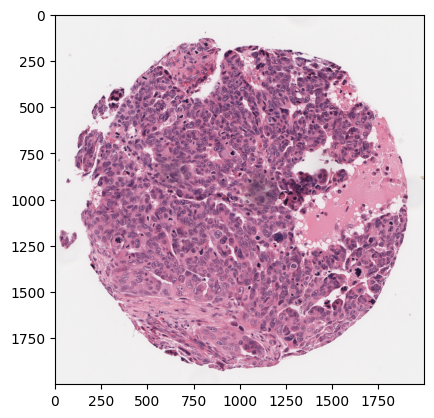

In [43]:
plt.imshow(get_image(TumorImg))
plt.show()

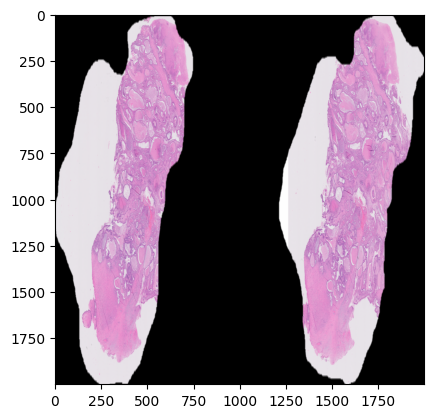

In [44]:
plt.imshow(get_image(NonTumorImg))
plt.show()

In [45]:
from tqdm import tqdm

In [46]:
TumorImg

61797

In [47]:
NonTumorImg

2906

(2000, 2000, 3)
(2000, 2000)


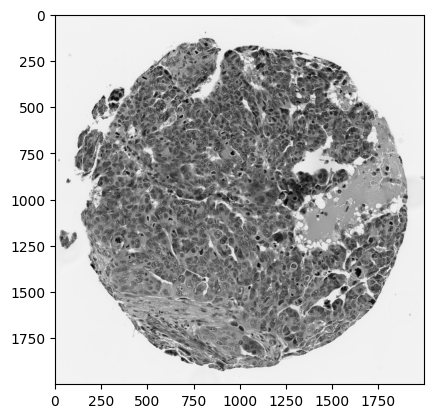

In [48]:
Tumor = get_image(TumorImg)
print(Tumor.shape)
GrayTumor = rgb2gray(Tumor)
plt.imshow(GrayTumor, cmap = mpl.cm.gray)
print(GrayTumor.shape)

(2000, 2000, 3)
(2000, 2000)


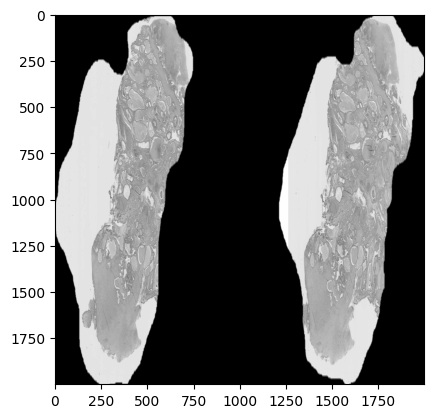

In [49]:
NonTumor = get_image(NonTumorImg)
print(NonTumor.shape)
GrayNonTumor = rgb2gray(NonTumor)
plt.imshow(GrayNonTumor, cmap = mpl.cm.gray)
print(GrayNonTumor.shape)

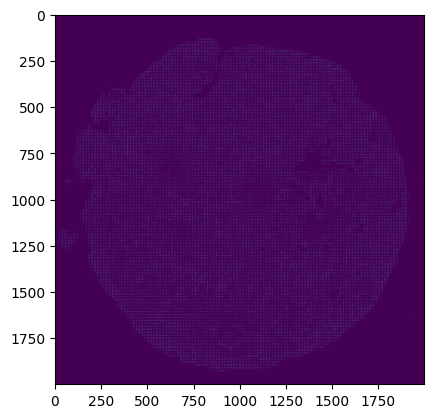

In [50]:
hog_features, hog_image = hog(GrayTumor,
                              visualize=True,
                              block_norm='L2-Hys',
                              pixels_per_cell=(16,16))
plt.imshow(hog_image)

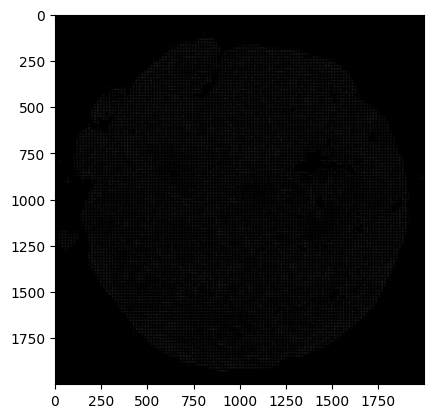

In [51]:
plt.imshow(hog_image, cmap=mpl.cm.gray)

In [52]:
%%time
def create_features(img):
    color_features = img.flatten()
    gray_image = rgb2gray(img)
    hog_features = hog(gray_image, block_norm='L2-Hys', pixels_per_cell=(16,16))
    flat_features = np.hstack([color_features,hog_features])
    return flat_features


CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 10 µs


In [53]:
Tumor_features = create_features(Tumor)
print("Tumor features shape:",Tumor_features.shape)

NonTumor_features = create_features(NonTumor)
print("NonTumor features shape:", NonTumor_features.shape)

Tumor features shape: (13225449,)
NonTumor features shape: (13225449,)


In [54]:
def create_feature_matrix3(T_dataframe):
    features_list = []
    
    for img_id in tqdm(T_dataframe.index[0:50]):
        img = get_image2(img_id)
        image_features = create_features(img)
        features_list.append(image_features)
      
    feature_matrix = np.array(features_list)
    return feature_matrix


In [55]:
def add_image(T_dataframe):
    image_list = []
    
    for img_id in tqdm(T_dataframe.index):
        img = get_image2(img_id)
        
        image_list.append(img)
      
    image_matrix = np.array(image_list)
    return image_matrix


In [56]:
df_thumbnail['is_tma'].value_counts()

is_tma
False    513
Name: count, dtype: int64

In [57]:
df_tumor = train_photodf_index[~train_photodf_index.index.isin(df_thumbnail.index)]

In [58]:
df_tumor

,label,image_width,image_height,is_tma
image_id,,,,
91,HGSC,3388,3388,True
4134,MC,2964,2964,True
8280,HGSC,2964,2964,True
9200,MC,3388,3388,True
13568,LGSC,2964,2964,True
17637,HGSC,2964,2964,True
21020,MC,3388,3388,True
29084,LGSC,3388,3388,True
31594,EC,3388,3388,True


In [59]:
df_tumor['is_tma'].value_counts()

is_tma
True    25
Name: count, dtype: int64

In [60]:
df_ntumor = df_thumbnail[df_thumbnail.index.isin(df_thumbnail.index[0:25])]

In [61]:
df_ntumor

,label,image_width,image_height,is_tma
image_id,,,,
4,HGSC,23785,20008,False
66,LGSC,48871,48195,False
281,LGSC,42309,15545,False
286,EC,37204,30020,False
431,HGSC,39991,40943,False
706,HGSC,75606,25965,False
970,HGSC,32131,18935,False
1020,HGSC,36585,33751,False
1080,HGSC,31336,23200,False


In [62]:
df_ntumor['is_tma'].value_counts()

is_tma
False    25
Name: count, dtype: int64

In [63]:
sampleFrame = [df_tumor,df_ntumor]
SampleTumor = pd.concat(sampleFrame)
SampleTumor.sort_index(axis=0, ascending=True)
SampleTumor.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50 entries, 91 to 2906
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   label         50 non-null     object
 1   image_width   50 non-null     int64 
 2   image_height  50 non-null     int64 
 3   is_tma        50 non-null     bool  
dtypes: bool(1), int64(2), object(1)
memory usage: 1.6+ KB


In [64]:
%%time
feature_matrix_50 =create_feature_matrix3(SampleTumor)

100%|██████████| 50/50 [30:46<00:00, 36.93s/it] 


CPU times: user 23min 56s, sys: 2min 37s, total: 26min 34s
Wall time: 30min 47s


In [65]:
X_train, X_test, y_train, y_test = train_test_split(feature_matrix_50 , SampleTumor.is_tma.values, test_size = .3, random_state = 1234123)
pd.Series(y_train).value_counts()


False    19
True     16
Name: count, dtype: int64

In [66]:
print('Training features matrix shape:', X_train.shape)
ss = StandardScaler()
train_stand = ss.fit_transform(X_train)
test_stand = ss.fit_transform(X_test)
print('Standardized training features matrix shape is:',train_stand.shape)
print('Standardized testing features matrix shape is:',test_stand.shape)

Training features matrix shape: (35, 3291600)
Standardized training features matrix shape is: (35, 3291600)
Standardized testing features matrix shape is: (15, 3291600)


In [67]:
pca = PCA(n_components=35)
X_train = pca.fit_transform(train_stand)
X_test = pca.transform(test_stand)
print("training features matrix is:", X_train.shape)
print("testing features matrix is:",X_test.shape)


training features matrix is: (35, 35)
testing features matrix is: (15, 35)


In [68]:
# define support vector classifier
svm = SVC(kernel='linear', probability=True, random_state=42)
# fit model
svm.fit(X_train, y_train)
# generate predictions
y_pred = svm.predict(X_test)
# calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Model accuracy is: ', accuracy)

Model accuracy is:  1.0


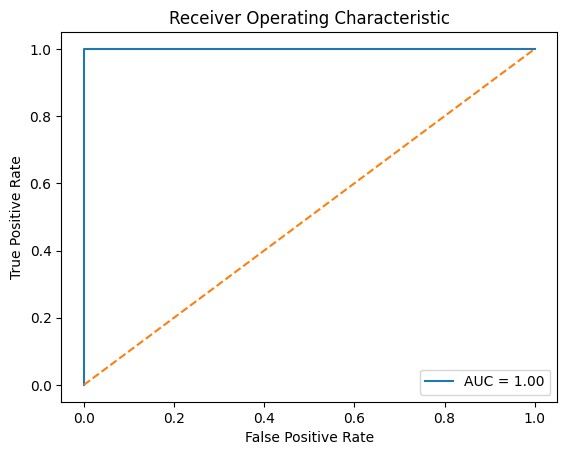

In [69]:
# predict probabilities for X_test using predict_proba
probabilities = svm.predict_proba(X_test)
# select the probabilities for label 1.0
y_proba = probabilities[:, 1]
# calculate false positive rate and true positive rate at different thresholds
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_proba, pos_label=1)
# calculate AUC
roc_auc = auc(false_positive_rate, true_positive_rate)
plt.title('Receiver Operating Characteristic')
# plot the false positive rate on the x axis and the true positive rate on the y axis
roc_plot = plt.plot(false_positive_rate,
                    true_positive_rate,
                    label='AUC = {:0.2f}'.format(roc_auc))
plt.legend(loc=0)
plt.plot([0,1], [0,1], ls='--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate');

In [70]:
df_tumor['label'].value_counts()

label
HGSC    5
MC      5
LGSC    5
EC      5
CC      5
Name: count, dtype: int64

In [71]:
df_tumor_matrix = add_image(df_tumor)


100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


In [72]:
df_ntumor_matrix = add_image(df_ntumor)


100%|██████████| 25/25 [30:32<00:00, 73.31s/it]


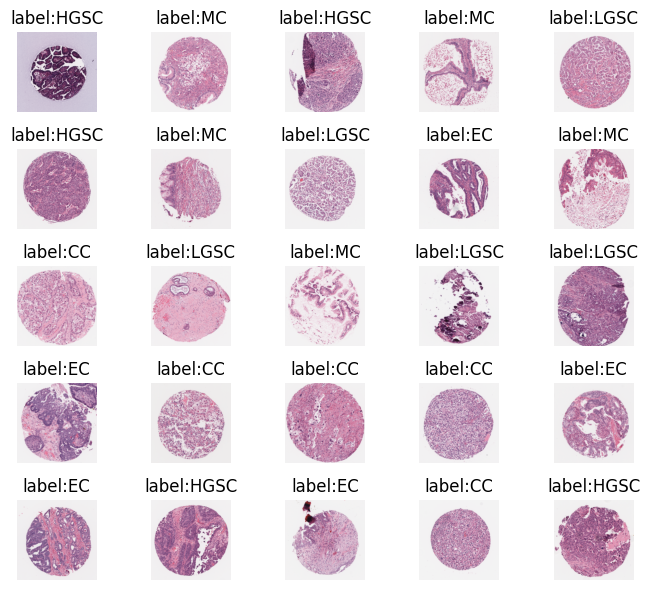

In [73]:
im = df_tumor_matrix
fig, axes = plt.subplots(5, 5, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(0,25):
    ax[i].imshow(im[i])
    ax[i].set_title("label:{}".format(df_tumor.iloc[i,0]))
    
     
    
for a in ax.ravel():
    a.axis('off')
    
       
fig.tight_layout()

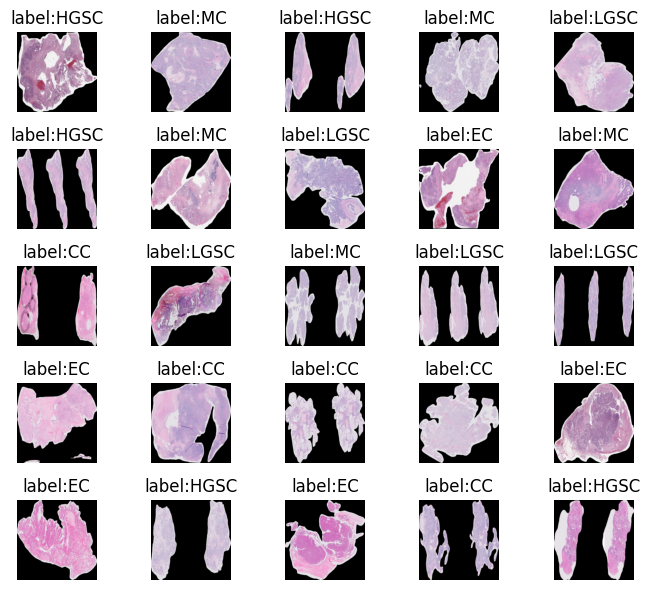

In [74]:
imN = df_ntumor_matrix
fig, axes = plt.subplots(5, 5, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()
for i in range(0,25):
    ax[i].imshow(imN[i])
    ax[i].set_title("label:{}".format(df_tumor.iloc[i,0]))
    
     
    
for a in ax.ravel():
    a.axis('off')
    
       
fig.tight_layout()

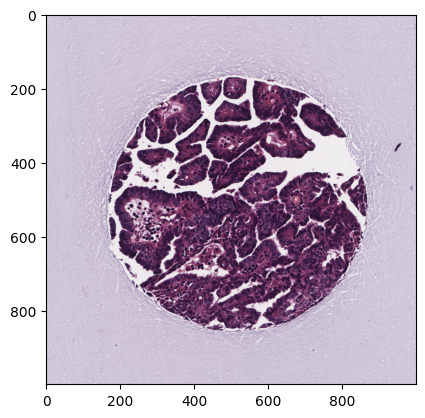

In [75]:
for i in range(0,1):
     plt.imshow(df_tumor_matrix[i])
     
     plt.show()

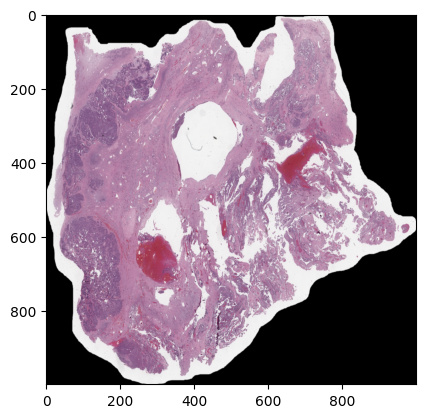

In [76]:
plt.imshow(df_ntumor_matrix[0])
plt.show()

